# Вступ до машинного навчання

Джерела: \
https://github.com/amueller/introduction_to_ml_with_python

## Демостраційна частина

In [1]:
# перший виклик matplotlib займає певний час, це нормально
%matplotlib inline

### Essential Libraries and Tools

#### NumPy

In [2]:
import numpy as np

x = np.array([[1, 2, 3], [4, 5, 6]])
print("x:\n{}".format(x))

x:
[[1 2 3]
 [4 5 6]]


#### SciPy

In [3]:
from scipy import sparse

# Create a 2D NumPy array with a diagonal of ones, and zeros everywhere else
eye = np.eye(4)
print("NumPy array:\n", eye)

NumPy array:
 [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


In [4]:
# Convert the NumPy array to a SciPy sparse matrix in CSR format
# Only the nonzero entries are stored
sparse_matrix = sparse.csr_matrix(eye)
print("\nSciPy sparse CSR matrix:\n", sparse_matrix)


SciPy sparse CSR matrix:
   (0, 0)	1.0
  (1, 1)	1.0
  (2, 2)	1.0
  (3, 3)	1.0


In [5]:
data = np.ones(4)
row_indices = np.arange(4)
col_indices = np.arange(4)
eye_coo = sparse.coo_matrix((data, (row_indices, col_indices)))
print("COO representation:\n", eye_coo)

COO representation:
   (0, 0)	1.0
  (1, 1)	1.0
  (2, 2)	1.0
  (3, 3)	1.0


#### matplotlib

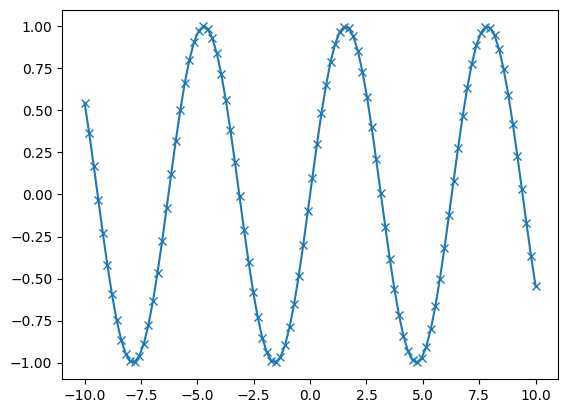

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt

# Generate a sequence of numbers from -10 to 10 with 100 steps in between
x = np.linspace(-10, 10, 100)
# Create a second array using sine
y = np.sin(x)
# The plot function makes a line chart of one array against another
plt.plot(x, y, marker="x")

#### pandas

In [7]:
import pandas as pd

# create a simple dataset of people
data = {'Name': ["John", "Anna", "Peter", "Linda"],
        'Location' : ["New York", "Paris", "Berlin", "London"],
        'Age' : [24, 13, 53, 33]
       }

data_pandas = pd.DataFrame(data)
# IPython.display allows "pretty printing" of dataframes
# in the Jupyter notebook
display(data_pandas)

,Name,Location,Age
0,John,New York,24
1,Anna,Paris,13
2,Peter,Berlin,53
3,Linda,London,33


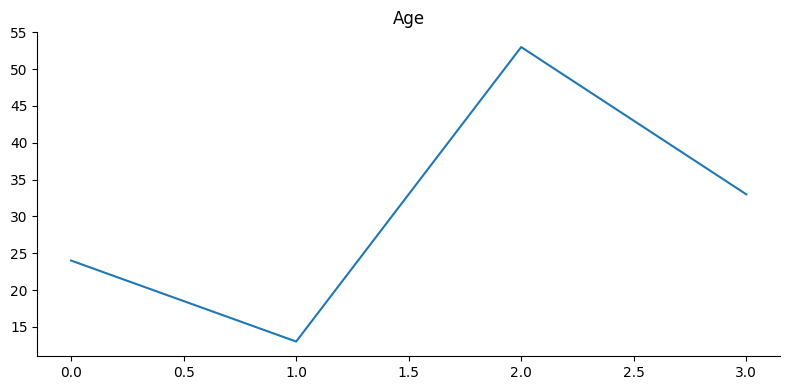

In [8]:
import numpy as np
import matplotlib.pyplot as plt

def value_plot(df, y, figscale=1):
    df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
    plt.gca().spines[['top', 'right']].set_visible(False)
    plt.tight_layout()

value_plot(data_pandas, 'Age')
plt.show()

In [9]:
# Select all rows that have an age column greater than 30
data_pandas[data_pandas['Age'] < 30]
data_pandas[data_pandas.Age > 30]

,Name,Location,Age
2,Peter,Berlin,53
3,Linda,London,33


In [10]:
mask = data_pandas['Age'] < 30

In [11]:
data_pandas['Age'] < 30

0     True
1     True
2    False
3    False
Name: Age, dtype: bool

In [12]:
data_pandas[(data_pandas['Location'] == 'London') & (data_pandas['Name'] == 'Linda')]

,Name,Location,Age
3,Linda,London,33


In [13]:
data_pandas['Location'] = 4 * ['London']

In [14]:
data_pandas[(data_pandas['Location'] == 'London')]

,Name,Location,Age
0,John,London,24
1,Anna,London,13
2,Peter,London,53
3,Linda,London,33


In [15]:
data_pandas.iloc[::-1, :]

,Name,Location,Age
3,Linda,London,33
2,Peter,London,53
1,Anna,London,13
0,John,London,24


In [16]:
data_pandas.tail(2)

,Name,Location,Age
2,Peter,London,53
3,Linda,London,33


In [17]:
data_pandas.shape[0]

4

In [18]:
data_pandas['gender'] = ['F', 'M', 'F', 'M']

In [19]:
data_pandas

,Name,Location,Age,gender
0,John,London,24,F
1,Anna,London,13,M
2,Peter,London,53,F
3,Linda,London,33,M


In [20]:
type(data_pandas), type(data_pandas['gender'])

(pandas.core.frame.DataFrame, pandas.core.series.Series)

In [21]:
data_pandas['gender'] = data_pandas['gender'].apply(lambda x: 1 if x == 'F' else 0)

In [22]:
data_pandas

,Name,Location,Age,gender
0,John,London,24,1
1,Anna,London,13,0
2,Peter,London,53,1
3,Linda,London,33,0


### Version check

In [23]:
import sys
print("Python version:", sys.version)

import pandas as pd
print("pandas version:", pd.__version__)

import matplotlib
print("matplotlib version:", matplotlib.__version__)

import numpy as np
print("NumPy version:", np.__version__)

import scipy as sp
print("SciPy version:", sp.__version__)

import IPython
print("IPython version:", IPython.__version__)

import sklearn
print("scikit-learn version:", sklearn.__version__)

Python version: 3.12.2 | packaged by Anaconda, Inc. | (main, Feb 27 2024, 17:28:07) [MSC v.1916 64 bit (AMD64)]
pandas version: 2.2.1
matplotlib version: 3.8.4
NumPy version: 1.26.4
SciPy version: 1.11.4
IPython version: 8.20.0
scikit-learn version: 1.3.0


### A First Application: Classifying Iris Species
#### Meet the Data

In [24]:
from sklearn.datasets import load_iris
iris_dataset = load_iris()

In [25]:
print("Keys of iris_dataset:\n", iris_dataset.keys())

Keys of iris_dataset:
 dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])


In [26]:
print(iris_dataset['DESCR'][:193] + "\n...")

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, pre
...


In [27]:
print("Target names:", iris_dataset['target_names'])

Target names: ['setosa' 'versicolor' 'virginica']


In [28]:
print("Feature names:\n", iris_dataset['feature_names'])

Feature names:
 ['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']


In [29]:
print("Type of data:", type(iris_dataset['data']))

Type of data: <class 'numpy.ndarray'>


In [30]:
iris_dataset['data'].shape

(150, 4)

In [31]:
print("Shape of data:", iris_dataset['data'].shape)

Shape of data: (150, 4)


In [32]:
print("First five rows of data:\n", iris_dataset['data'][:5])

First five rows of data:
 [[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]]


In [33]:
print("Type of target:", type(iris_dataset['target']))

Type of target: <class 'numpy.ndarray'>


In [34]:
print("Shape of target:", iris_dataset['target'].shape)

Shape of target: (150,)


In [35]:
print("Target:\n", iris_dataset['target'])

Target:
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2]


#### Measuring Success: Training and Testing Data

In [36]:
df = pd.DataFrame(iris_dataset['data'])

In [37]:
df.columns = iris_dataset['feature_names']

In [38]:
df['target'] = iris_dataset['target']

In [39]:
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [40]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( # 80/20
    df.drop(['target'], axis=1), df['target'], test_size=0.2, random_state=42)

In [41]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

X_train shape: (120, 4)
y_train shape: (120,)


In [42]:
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_test shape: (30, 4)
y_test shape: (30,)


#### First Things First: Look at Your Data

array([[<Axes: xlabel='sepal length (cm)', ylabel='sepal length (cm)'>,
        <Axes: xlabel='sepal width (cm)', ylabel='sepal length (cm)'>,
        <Axes: xlabel='petal length (cm)', ylabel='sepal length (cm)'>,
        <Axes: xlabel='petal width (cm)', ylabel='sepal length (cm)'>],
       [<Axes: xlabel='sepal length (cm)', ylabel='sepal width (cm)'>,
        <Axes: xlabel='sepal width (cm)', ylabel='sepal width (cm)'>,
        <Axes: xlabel='petal length (cm)', ylabel='sepal width (cm)'>,
        <Axes: xlabel='petal width (cm)', ylabel='sepal width (cm)'>],
       [<Axes: xlabel='sepal length (cm)', ylabel='petal length (cm)'>,
        <Axes: xlabel='sepal width (cm)', ylabel='petal length (cm)'>,
        <Axes: xlabel='petal length (cm)', ylabel='petal length (cm)'>,
        <Axes: xlabel='petal width (cm)', ylabel='petal length (cm)'>],
       [<Axes: xlabel='sepal length (cm)', ylabel='petal width (cm)'>,
        <Axes: xlabel='sepal width (cm)', ylabel='petal width (cm)'>,
  

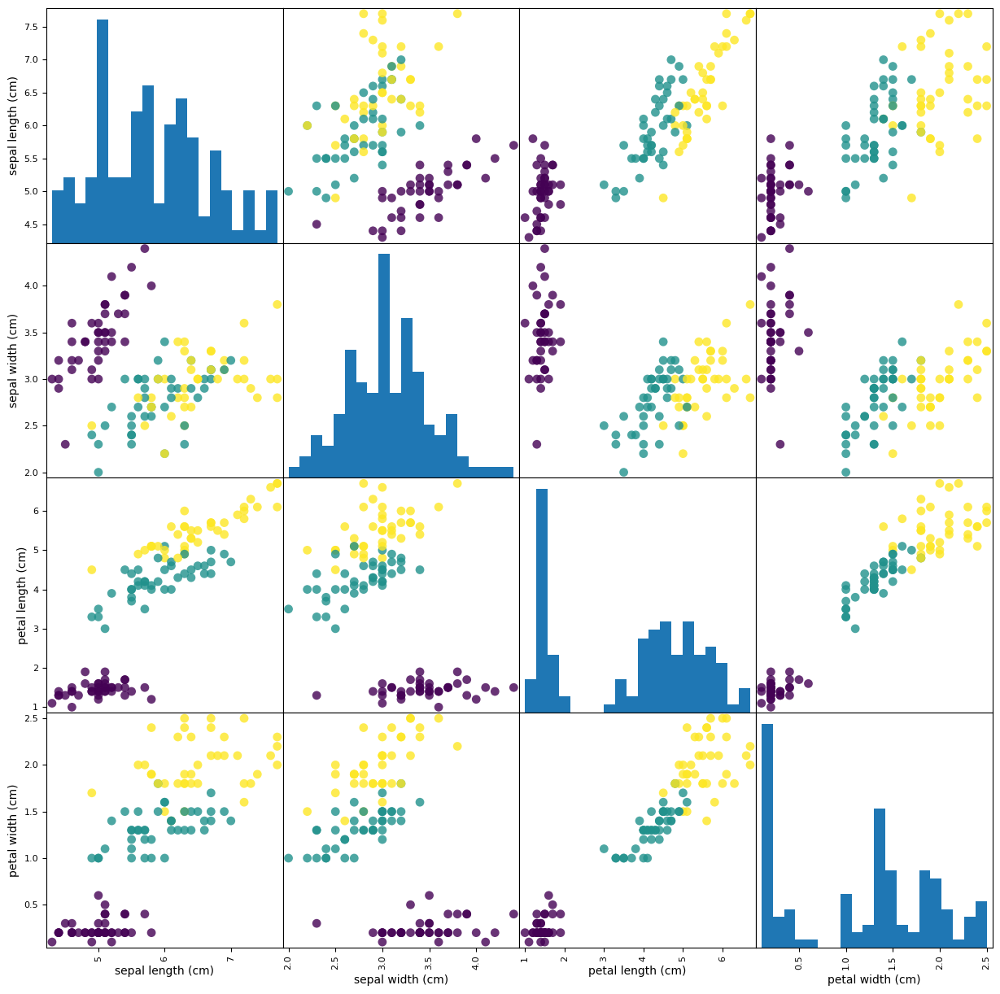

In [43]:
# create a scatter matrix from the dataframe, color by y_train
pd.plotting.scatter_matrix(X_train, c=y_train, figsize=(15, 15),
                           marker='o', hist_kwds={'bins': 20}, s=60,
                           alpha=.8)


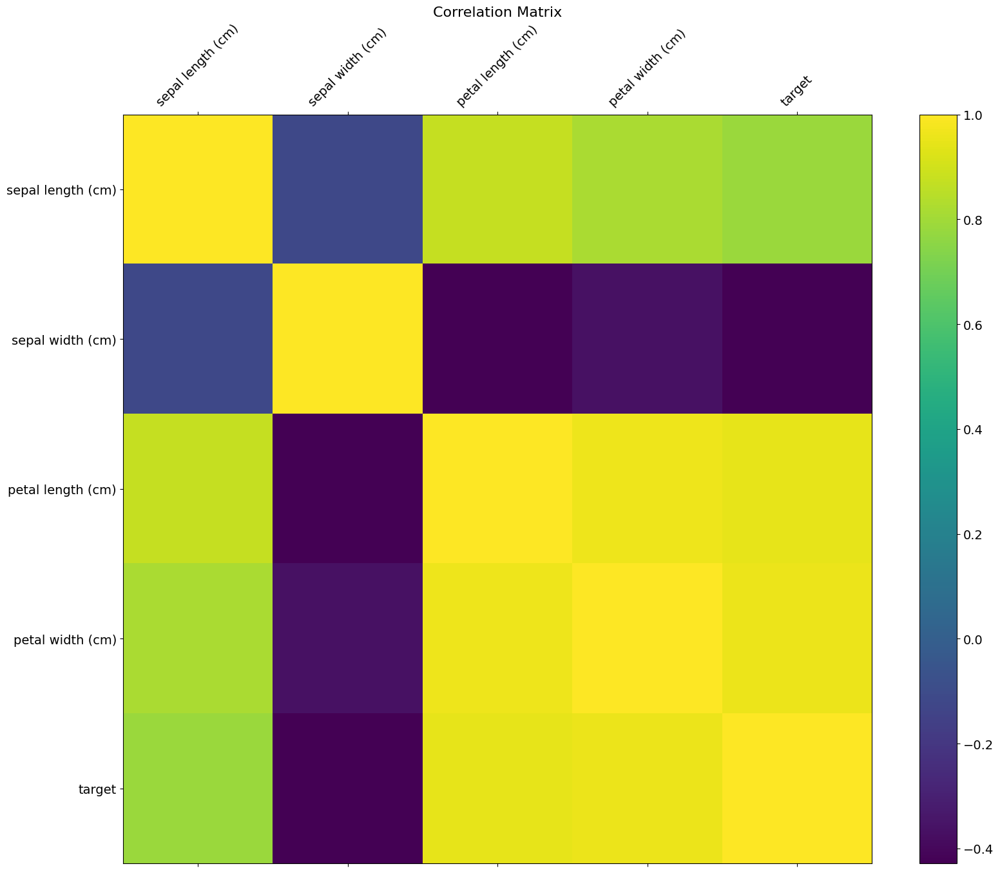

In [44]:
f = plt.figure(figsize=(19, 15))
plt.matshow(df.corr(), fignum=f.number)
plt.xticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns , fontsize=14, rotation=45)
plt.yticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

#### Building Your First Model: k-Nearest Neighbors

In [45]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=1)

In [46]:
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

#### Making Predictions

In [47]:
X_new = np.array([[5, 2.9, 1, 0.2]])
print("X_new.shape:", X_new.shape)

X_new.shape: (1, 4)


In [48]:
prediction = knn.predict(X_new)
print("Prediction:", prediction)
print("Predicted target name:",
       iris_dataset['target_names'][prediction])

Prediction: [0]
Predicted target name: ['setosa']


C:\Users\Pavlo\anaconda3\envs\studying\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


#### Evaluating the Model

In [49]:
y_pred = knn.predict(X_test)
print("Test set predictions:\n", y_pred)

Test set predictions:
 [1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0]


In [50]:
print("Test set score: {:.2f}".format(np.mean(y_pred == y_test)))

Test set score: 1.00


In [51]:
print("Test set score: {:.2f}".format(knn.score(X_test, y_test)))

Test set score: 1.00


### Summary and Outlook

In [52]:
X_train, X_test, y_train, y_test = train_test_split(
    iris_dataset['data'], iris_dataset['target'], random_state=0)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

print("Test set score: {:.2f}".format(knn.score(X_test, y_test)))

Test set score: 0.97


## Home assignment

- This is the part I of H/A 1.
- Repeat the dataset preparation before training the model for the wine classification sample. Write your own brief description of the dataset (4-6 sentences).

* In this part, you are to perform an in-depth Exoloratory Data Analysis (EDA) only. You don't need to train and and evaluate a model - that will be part II.
- For EDA, do the following:
 - Investigate data types, number of features, target and its distribution
 - plot histograms
 - look for correlation of features (with target)
 - encode and/or normalize (scale) the features if necessary
 - look for anomalies: sample with > 3*sigma (std.) from the mean
 
Once you have finished the EDA and preprocessing, save the data frame with `df.to_csv('df_EDA.csv, index=False)` and proceed to the second notebook of the H/A 1 (02_linear_models) 

In [80]:
from sklearn.datasets import load_wine
import pandas as pd
from ydata_profiling import ProfileReport

import math
import numpy as np
from scipy.stats import shapiro 
from scipy.stats import lognorm
import seaborn as sns
import matplotlib.pyplot as plt

In [60]:
wine_dataset = load_wine()

In [63]:
wine_df = pd.DataFrame(data=wine_dataset.data, columns=wine_dataset.feature_names)
wine_df['target'] = wine_dataset.target

## Exploratory Data Analysis (EDA)

In [56]:
profile = ProfileReport(wine_df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Test for normality of distributions

In [71]:

# Select only numeric columns
numeric_cols = wine_df.select_dtypes(include='number')

for col in numeric_cols.columns:
    # Apply Shapiro-Wilk test
    stat, p_value = shapiro(numeric_cols[col])
    
    # Output the result
    print(f"Shapiro-Wilk test for column '{col}':")
    print(f"    - Test Statistic: {stat}")
    print(f"    - p-value: {p_value}")
    if p_value < 0.05:
        print("    - Conclusion: The data is not normally distributed (reject null hypothesis)")
    else:
        print("    - Conclusion: The data is normally distributed (fail to reject null hypothesis)")
    print()

Shapiro-Wilk test for column 'alcohol':
    - Test Statistic: 0.981804609298706
    - p-value: 0.020050711929798126
    - Conclusion: The data is not normally distributed (reject null hypothesis)

Shapiro-Wilk test for column 'malic_acid':
    - Test Statistic: 0.8887840509414673
    - p-value: 2.94582247484243e-10
    - Conclusion: The data is not normally distributed (reject null hypothesis)

Shapiro-Wilk test for column 'ash':
    - Test Statistic: 0.9839476346969604
    - p-value: 0.038691021502017975
    - Conclusion: The data is not normally distributed (reject null hypothesis)

Shapiro-Wilk test for column 'alcalinity_of_ash':
    - Test Statistic: 0.9902263879776001
    - p-value: 0.26394858956336975
    - Conclusion: The data is normally distributed (fail to reject null hypothesis)

Shapiro-Wilk test for column 'magnesium':
    - Test Statistic: 0.9383310079574585
    - p-value: 6.345416068143095e-07
    - Conclusion: The data is not normally distributed (reject null hypothesi

### Normality Test Results

Only the following variable is normally distributed:
*alcalinity_of_ash*

But I don't think that it would impact our modeling in future, since features can be not normally distributed. But the dependent variable should be normally distributed, so if we wanted to use regression we could take only *alcalinity_of_ash* as dependent variable.


1. From EDA I can see that we don't have variables that corelate too much. But another question is what corelation is too high? I think that it is ok to have even |0.9| or |0.8| as long as we have a lot of features and we are interested in prediction itself and not the estimation of the cooficients of the regression.

2. We also have no missing values, what is good, meaning that there is no need to delete them

### Outliers detection

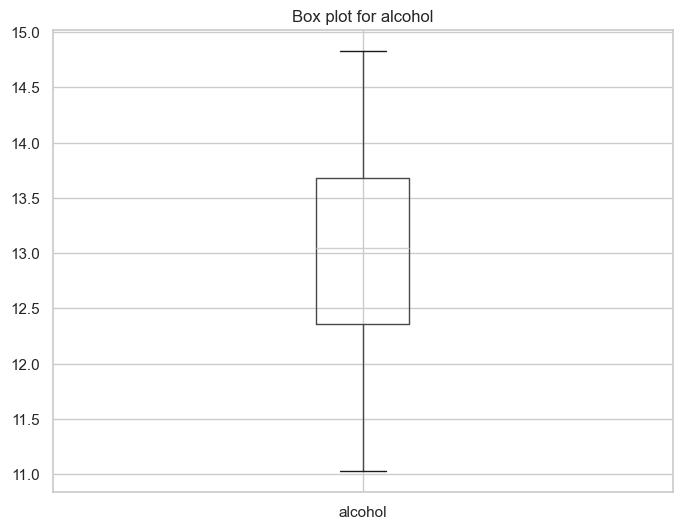

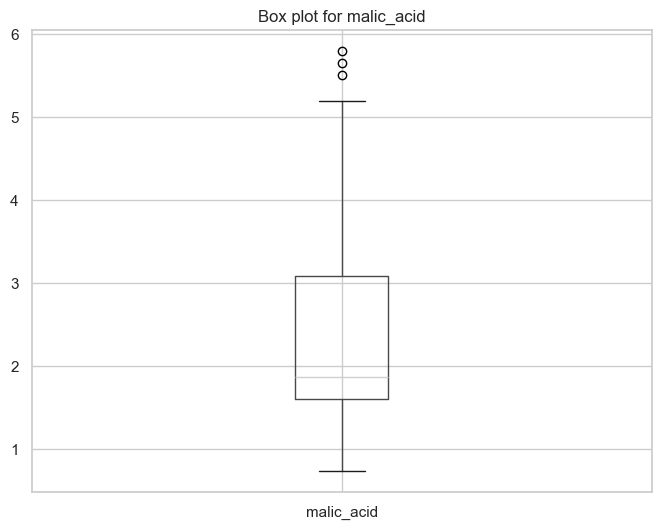

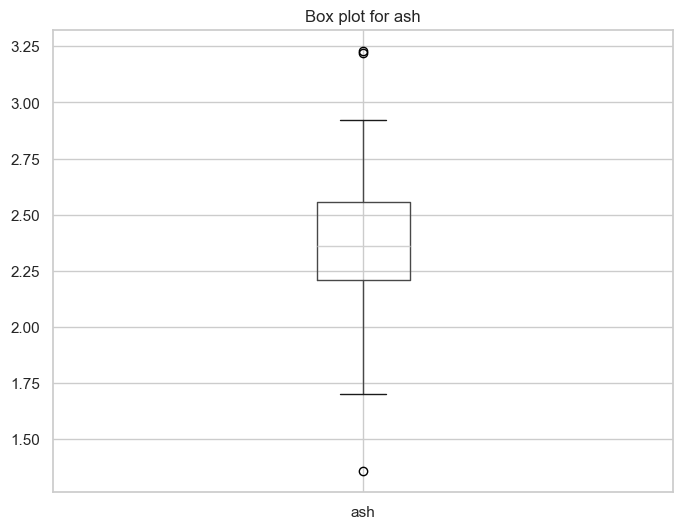

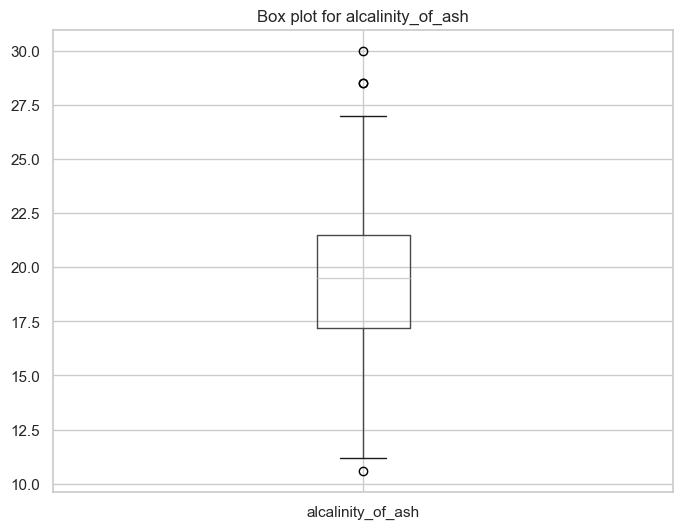

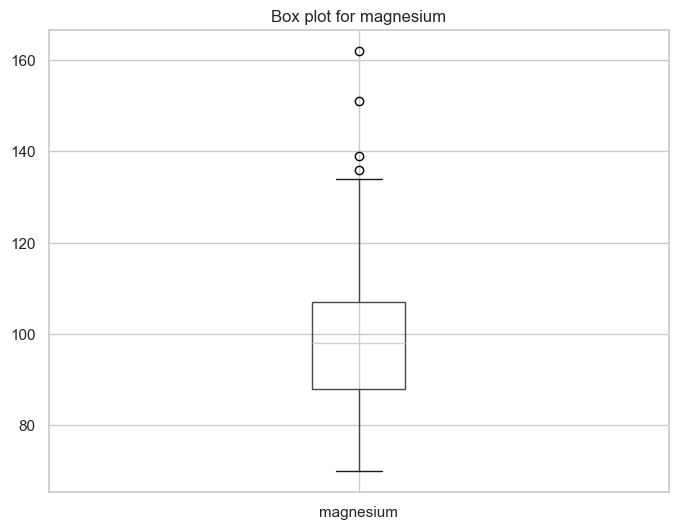

...

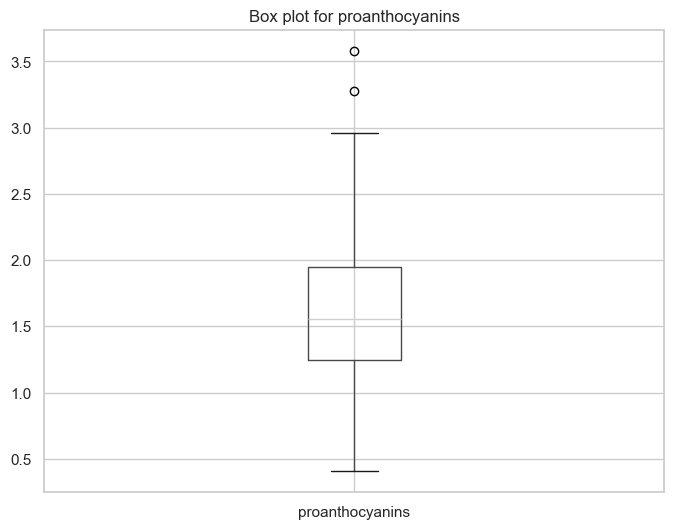

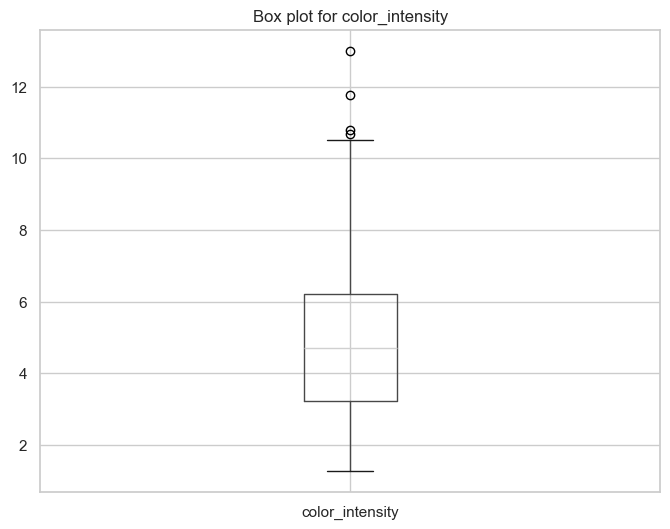

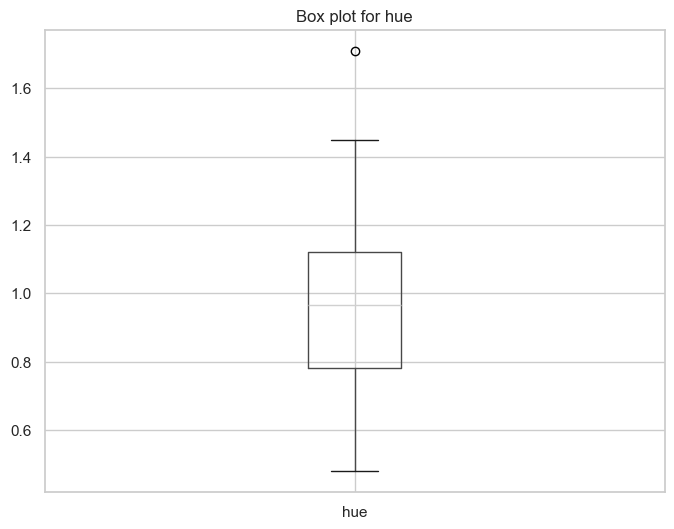

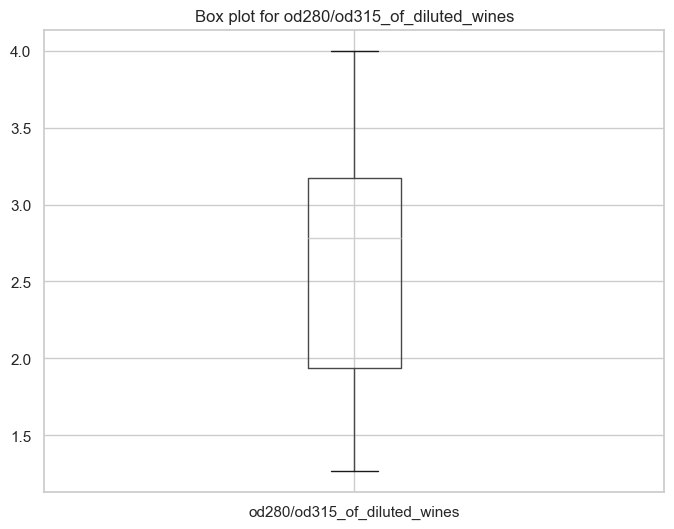

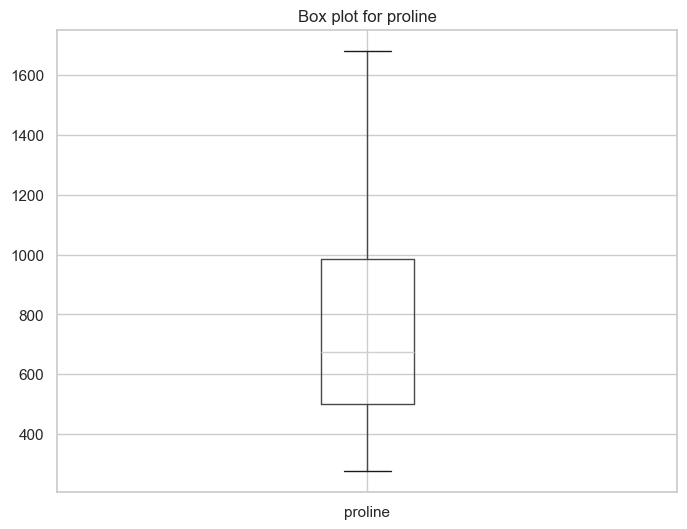

In [82]:
for column in wine_df.columns:
    if column != 'target':  # Exclude the target variable
        plt.figure(figsize=(8, 6))
        wine_df.boxplot(column=column)
        plt.title(f'Box plot for {column}')
        plt.show()

In [83]:
# Calculate the outliers using the interquartile range (IQR) method
def detect_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = series[(series < lower_bound) | (series > upper_bound)]
    return outliers

# Create an empty list to store variables with outliers
variables_with_outliers = []

# Iterate over each column in the DataFrame
for column in wine_df.columns:
    if column != 'target':  # Exclude the target variable
        outliers = detect_outliers(wine_df[column])
        if not outliers.empty:
            variables_with_outliers.append(column)

# Output the list of variables with outliers
print("Variables with outliers:")
for variable in variables_with_outliers:
    print(variable)

Variables with outliers:
malic_acid
ash
alcalinity_of_ash
magnesium
proanthocyanins
color_intensity
hue


As we can see the list of outliers matches exactly what we saw in the box-plots. I am not sure what to do with it, I guess delete.

#### Transformations


1. **Outlier Detection**: It defines a function (`detect_outliers_zscore`) to find outliers using Z-scores.
2. **Custom Transformer**: A transformer called `RemoveOutliers` is created to remove rows with two or more outliers.
3. **Preprocessing Setup**: Preprocessing steps are set for numeric and categorical data.
4. **Pipeline Creation**: A pipeline is formed to first remove outliers and then preprocess the data.
5. **Data Transformation**: The pipeline is fitted to the data and transforms it.
6. **DataFrame Creation**: The transformed data is converted into a DataFrame.

The aim is to clean and prepare the data for training a machine learning model.

In [122]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import numpy as np
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)  # None means unlimited

# Define function to detect outliers using Z-score
def detect_outliers_zscore(data):
    z_scores = np.abs((data - data.mean()) / data.std())
    return z_scores > 3

# Custom transformer to remove rows with at least two outliers
class RemoveOutliers(BaseEstimator, TransformerMixin):
    def __init__(self, threshold):
        self.threshold = threshold
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        outliers = detect_outliers_zscore(X).sum(axis=1)
        return X[outliers < self.threshold]


In [123]:
# Define column lists
categorical_cols = ['target']
numeric_cols = [col for col in wine_df.columns if col not in categorical_cols]

# Create preprocessing steps
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Create column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Create the full pipeline
pipeline = Pipeline(steps=[
    ('remove_outliers', RemoveOutliers(threshold=1)),
    ('preprocessor', preprocessor)
])

# Fit the pipeline to data
pipeline.fit(wine_df)

# Transform data using the fitted pipeline
wine_df_transformed = pipeline.transform(wine_df)


In [124]:
# Get feature names after one-hot encoding
feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(input_features=categorical_cols)
all_feature_names = numeric_cols + list(feature_names)
wine_df_transformed_pd = pd.DataFrame(wine_df_transformed, columns=all_feature_names)

In [120]:
wine_df_transformed_pd.to_csv('df_EDA.csv', index=False)